In [1]:
from diffusers import (
    StableDiffusionControlNetPipeline, ControlNetModel,
    StableDiffusionPipeline, DDIMScheduler, AutoencoderKL
)
from PIL import Image
import torch
import os

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [3]:
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-scribble",
    torch_dtype=torch.float16
).to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

In [4]:
sketch_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    safety_checker = None,
    torch_dtype=torch.float16
).to(device)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


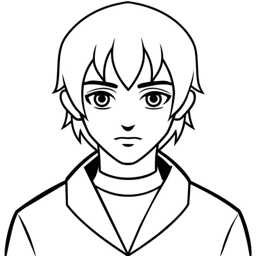

In [5]:
sketch = Image.open("boy_sketch.png").convert("RGB").resize((512, 512))
sketch.resize((350, 350))

In [6]:
stylized_image_prompt = (
    "a boy, anime style, short brown hair, green eyes, teenage, standing in sunlit forest, "
    "detailed green leafy canopies in background, tall trees with thick trunks, dappled sunlight, "
    "wearing casual clothes, hoodie, vibrant colors, highly detailed, sharp focus, 4k"
     "by Katsuya Terada and Ilya Kuvshinov"
)
negative_prompt = "blurry, low quality, distorted, bad anatomy, extra limbs, eyeglasses"

  0%|          | 0/40 [00:00<?, ?it/s]

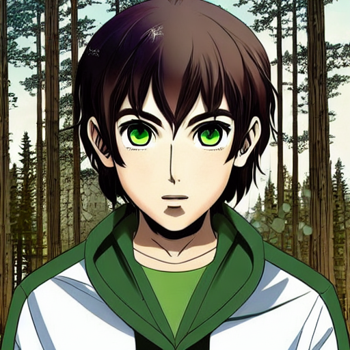

In [7]:
sunlit_image_without_lora=sketch_pipe(
    prompt=stylized_image_prompt,
    negative_prompt=negative_prompt,
    image=sketch,
    num_inference_steps=40,
    guidance_scale=8.0,
    generator=torch.manual_seed(42),
    controlnet_conditioning_scale= 0.9
).images[0]
sunlit_image_without_lora.resize((350,350))

In [8]:
sketch_pipe.load_lora_weights("Norod78/sd15-megaphone-lora")

SD15-Megaphone-LoRA.safetensors:   0%|          | 0.00/19.0M [00:00<?, ?B/s]

  0%|          | 0/40 [00:00<?, ?it/s]

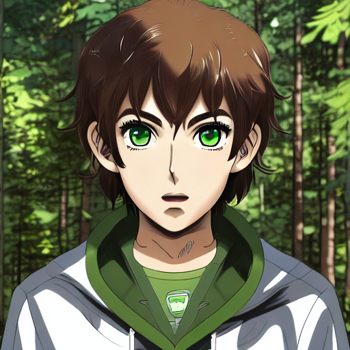

In [10]:
sunlit_image_with_lora = sketch_pipe(
    prompt=stylized_image_prompt,
    negative_prompt=negative_prompt,
    image=sketch,
    num_inference_steps=40,
    guidance_scale=8.0,
    generator=torch.manual_seed(42)
).images[0]
sunlit_image_with_lora.resize((350,350))

In [11]:
rainy_prompt = (
    "a boy, anime style, short brown hair, green eyes, teenage, standing in rainy forest, "
    "detailed green leafy canopies in background, tall trees with thick trunks, heavy rain, "
    "wearing casual clothes, hoodie, vibrant colors, highly detailed, sharp focus, 4k, "
    "stormy atmosphere, dramatic lighting, "
     "by Katsuya Terada and Ilya Kuvshinov"
)
negative_rainy_pormpt="blurry, low quality, distorted, bad anatomy"

  0%|          | 0/40 [00:00<?, ?it/s]

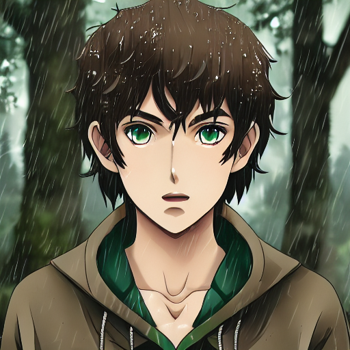

In [12]:
rainy_image = sketch_pipe(
    prompt=rainy_prompt,
    negative_prompt="blurry, low quality, distorted, bad anatomy",
    image=sketch,
    num_inference_steps=40,
    guidance_scale=8.0,
    controlnet_conditioning_scale=0.9,
    generator=torch.manual_seed(42)
).images[0]
rainy_image.resize((350,350))

In [13]:
sketch_pipe.load_ip_adapter("h94/IP-Adapter", subfolder="models",weight_name="ip-adapter_sd15.safetensors")
sketch_pipe.set_ip_adapter_scale(0.5)

ip-adapter_sd15.safetensors:   0%|          | 0.00/44.6M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.53G [00:00<?, ?B/s]

  0%|          | 0/40 [00:00<?, ?it/s]

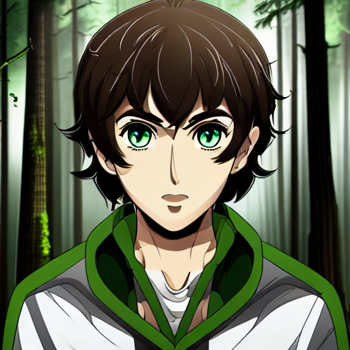

In [14]:
rainy_ip_adapter_image = sketch_pipe(
    prompt="in rainy forest, heavy rain, stormy atmosphere",
    negative_prompt=negative_rainy_pormpt,
    image=sketch,
    ip_adapter_image=sunlit_image_with_lora,
    num_inference_steps=40,
    guidance_scale=8.0,
    generator=torch.manual_seed(42)
).images[0]
rainy_ip_adapter_image.resize((350,350))

In [15]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [16]:
noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False,
    steps_offset=1,
)

In [17]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to(dtype=torch.float16)

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [18]:
pipe = StableDiffusionPipeline.from_pretrained(
    "SG161222/Realistic_Vision_V4.0_noVAE",
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None
).to(device)

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [19]:
pipe.load_ip_adapter(
    "h94/IP-Adapter",
    subfolder="models",
    weight_name="ip-adapter_sd15.bin",
    device=device,
    num_tokens=16
)

ip-adapter_sd15.bin:   0%|          | 0.00/44.6M [00:00<?, ?B/s]

In [20]:
def generate_images(image, prompt=None, scale=0.5):

    pipe.set_ip_adapter_scale(scale)

    kwargs = {
        "prompt": prompt if prompt else "",
        "ip_adapter_image": image,
        "num_images_per_prompt": 4,
        "num_inference_steps": 50,
        "seed": 42
    }

    images = pipe(**kwargs).images
    grid = image_grid(images, 1, 4)
    display(grid)

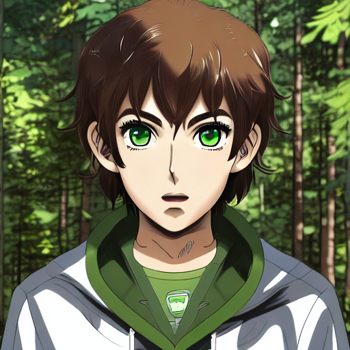

In [21]:
sunlit_image_with_lora.resize((350,350))

  0%|          | 0/50 [00:00<?, ?it/s]

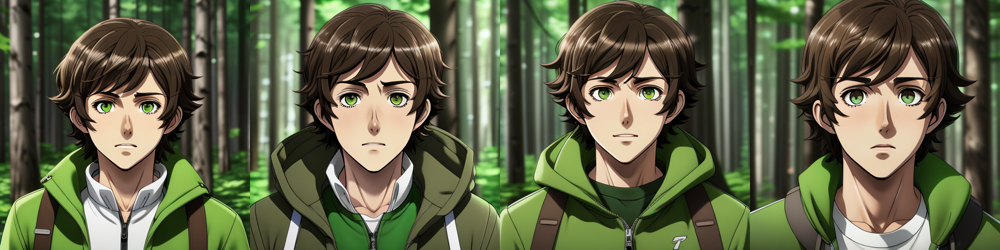

In [23]:
generate_images(
    sunlit_image_with_lora,
    prompt="",
    scale=0.7
)

  0%|          | 0/50 [00:00<?, ?it/s]

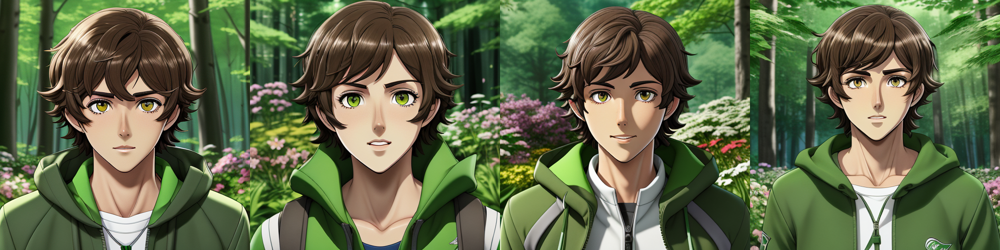

In [24]:
generate_images(
    sunlit_image_with_lora,
    prompt="best quality, high quality, in a garden with flowers",
    scale=0.6
)

  0%|          | 0/50 [00:00<?, ?it/s]

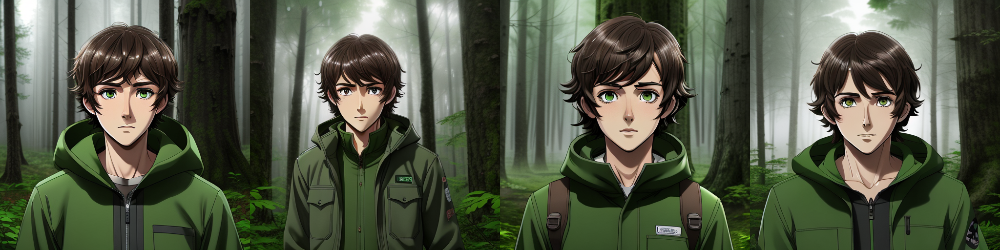

In [25]:
generate_images(
    sunlit_image_with_lora,
    prompt="best quality, high quality, in a forest with trees, heavy rain, stormy atmosphere",
    scale=0.5
)

  0%|          | 0/50 [00:00<?, ?it/s]

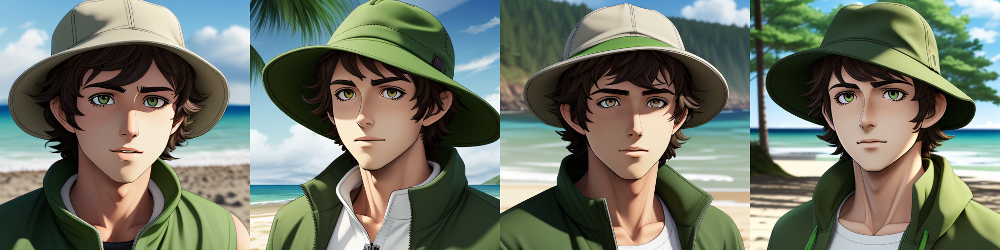

In [26]:
generate_images(
    sunlit_image_with_lora,
       prompt="best quality, high quality, wearing a hat on the beach",
    scale=0.6
)

  0%|          | 0/50 [00:00<?, ?it/s]

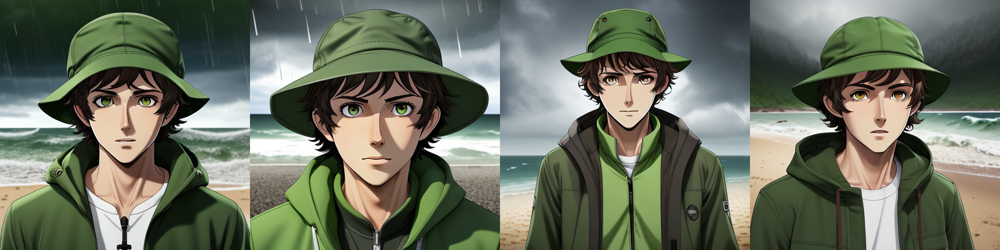

In [27]:
generate_images(
    sunlit_image_with_lora,
       prompt="best quality, high quality, wearing a hat on the beach, heavy rain, stormy atmosphere",
    scale=0.6
)

In [28]:
def generate_frames(image, prompt=None, scale=0.5):

    pipe.set_ip_adapter_scale(scale)

    kwargs = {
        "prompt": prompt if prompt else "",
        "ip_adapter_image": image,
        "num_images_per_prompt": 4,
        "num_inference_steps": 50,
        "seed": 42
    }

    return pipe(**kwargs).images


In [29]:
import os
os.makedirs("frames", exist_ok=True)

In [30]:
prompt_base="best quality, high quality,"
env_start=""
env_end="in a rainy forest, heavy rain"

In [31]:
def blend_prompts(alpha):
  return f"{prompt_base}" if alpha < 0.5 else f"{prompt_base}, {env_end}"


In [32]:
frames = []
num_frames = 10
base_seed = 42

print("Generating frames")

for i in range(1, num_frames):
    alpha = i / num_frames
    prompt = blend_prompts(alpha)
    new_frames=generate_frames(
            sunlit_image_with_lora,
            prompt=prompt,
            scale=0.7
        )
    s_index=len(frames)+1
    frames.extend(new_frames)
    z_index=len(frames)-1

    print(f"Frame {s_index} to {z_index} saved")

Generating frames


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 1 to 3 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 5 to 7 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 9 to 11 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 13 to 15 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 17 to 19 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 21 to 23 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 25 to 27 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 29 to 31 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 33 to 35 saved


In [33]:
import imageio.v2 as imageio
import numpy as np

video_path = "output_animation_video.mp4"
fps = 8
print(f"Saving video at {fps} fps...")

with imageio.get_writer(video_path, fps=fps) as writer:
    for i, frame in enumerate(frames):
        writer.append_data(np.array(frame))
print(f"Video saved")

Saving video at 8 fps...
Video saved


In [34]:
from IPython.display import Video
Video(video_path,embed=True)

In [43]:
prompt_base="best quality, high quality, wearing a hat"
env_start=" on the beach"
env_end="a rainy night, heavy rain"

In [44]:
def blend_prompts(alpha):
  return f"{prompt_base}, {env_start}" if alpha < 0.5 else f"{prompt_base}, {env_end}"

In [45]:
frames = []
num_frames = 10
base_seed = 42

print("Generating frames")

for i in range(1, num_frames):
    alpha = i / num_frames
    prompt = blend_prompts(alpha)
    new_frames=generate_frames(
            sunlit_image_with_lora,
            prompt=prompt,
            scale=0.7
        )
    s_index=len(frames)+1
    frames.extend(new_frames)
    z_index=len(frames)-1

    print(f"Frame {s_index} to {z_index} saved")

Generating frames


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 1 to 3 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 5 to 7 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 9 to 11 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 13 to 15 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 17 to 19 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 21 to 23 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 25 to 27 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 29 to 31 saved


  0%|          | 0/50 [00:00<?, ?it/s]

Frame 33 to 35 saved


In [47]:
import imageio.v2 as imageio
import numpy as np

video_path = "output_animation_video.mp4"
fps = 8
print(f"Saving video at {fps} fps...")

with imageio.get_writer(video_path, fps=fps) as writer:
    for i, frame in enumerate(frames):
        writer.append_data(np.array(frame))
print(f"Video saved")

Saving video at 8 fps...
Video saved


In [48]:
from IPython.display import Video
Video(video_path,embed=True)